#                    Puc Minas Pós - CIÊNCIA DE DADOS E BIG DATA  

###                            Analise das operadores de streming Netflix e Amazon Prime

### Aluno: Brenno dos Santos Neves

#### Importação das bibliotecas

In [6]:
#Importação das bibliotecas
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import statsmodels
import statsmodels.formula.api as smf
import statsmodels.stats.api as sms
from scipy import stats
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from statsmodels.stats.diagnostic import lilliefors
from apyori import apriori
from IPython.display import Image
# Modelo de Naive Bayes
from sklearn.model_selection import train_test_split
from sklearn.naive_bayes import GaussianNB
from sklearn.preprocessing import LabelEncoder
from sklearn.metrics import confusion_matrix, accuracy_score
from yellowbrick.classifier import ConfusionMatrix
#Modelo de Arvore de decisão
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
import graphviz
from sklearn.tree import export_graphviz

# Random Forest
from sklearn.ensemble import RandomForestClassifier
from IPython.display import display, SVG
from subprocess import call
#from sklearn.externals.six import StringIO



In [7]:
#versão do python
!python --version

Python 3.9.13


### Leitura e tratamento dos datasets

In [8]:
# Carregar os dados das operadoras de Streaming
dNetflix = pd.read_csv('PUC/Netflix.csv')
# link https://www.kaggle.com/datasets/victorsoeiro/netflix-tv-shows-and-movies
dAmazon = pd.read_csv('PUC/amazon_prime.csv')
#link https://www.kaggle.com/datasets/shivamb/amazon-prime-movies-and-tv-shows
dHbo = pd.read_csv('PUC/HBO.csv')
#link https://www.kaggle.com/datasets/victorsoeiro/hbo-max-tv-shows-and-movies


In [9]:
# Selecionar quais campos iremos usar das 3 bases carregadas
dfNetflix = dNetflix[['title','type','release_year','runtime','genres','production_countries','imdb_score',
'imdb_votes','tmdb_score']]
dfNetflix= dfNetflix.dropna()
dfNetflix['streaming'] = 'Netflix'
dfAmazon=dAmazon[['title','type','release_year','runtime','genres','production_countries','imdb_score',
 'imdb_votes','tmdb_score']]
dfAmazon= dfAmazon.dropna()
dfAmazon['streaming'] = 'Amazon'
dfHbo=dHbo[['title','type','release_year','runtime','genres','production_countries','imdb_score',
'imdb_votes','tmdb_score']]
dfHbo = dfHbo.dropna()
dfHbo['streaming'] = 'HBO'

In [10]:
# Visualizar o dataset dfHbo
dfHbo

,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score,streaming
0,The Wizard of Oz,MOVIE,1939,102,"['fantasy', 'family']",['US'],8.1,389774.0,7.6,HBO
1,Citizen Kane,MOVIE,1941,119,['drama'],['US'],8.3,433804.0,8.0,HBO
2,Casablanca,MOVIE,1942,102,"['drama', 'romance', 'war']",['US'],8.5,558849.0,8.2,HBO
3,The Big Sleep,MOVIE,1946,116,"['thriller', 'crime']",['US'],7.9,84494.0,7.7,HBO
4,The Maltese Falcon,MOVIE,1941,100,"['thriller', 'romance', 'crime']",['US'],8.0,156603.0,7.8,HBO
...,...,...,...,...,...,...,...,...,...,...
3275,Breathless,MOVIE,2021,106,"['crime', 'drama', 'thriller']",['DO'],6.3,27.0,5.9,HBO
3279,Furry Friends Forever: Elmo Gets a Puppy,MOVIE,2021,26,['animation'],['US'],6.8,14.0,10.0,HBO
3283,Marlon Wayans: You Know What It Is,MOVIE,2021,58,['comedy'],['US'],3.8,224.0,5.4,HBO
3284,Ahir Shah: Dots,MOVIE,2021,61,['comedy'],[],5.8,69.0,7.0,HBO


In [11]:
# Verificar tamanho do dataset
dfHbo.shape

(2751, 10)

In [12]:
#Visualizar o dataset dfAmazon
dfAmazon

,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score,streaming
0,The Three Stooges,SHOW,1934,19,"['comedy', 'family', 'animation', 'action', 'f...",['US'],8.6,1092.0,7.6,Amazon
1,The General,MOVIE,1926,78,"['action', 'drama', 'war', 'western', 'comedy'...",['US'],8.2,89766.0,8.0,Amazon
2,The Best Years of Our Lives,MOVIE,1946,171,"['romance', 'war', 'drama']",['US'],8.1,63026.0,7.8,Amazon
3,His Girl Friday,MOVIE,1940,92,"['comedy', 'drama', 'romance']",['US'],7.8,57835.0,7.4,Amazon
4,In a Lonely Place,MOVIE,1950,94,"['thriller', 'drama', 'romance']",['US'],7.9,30924.0,7.6,Amazon
...,...,...,...,...,...,...,...,...,...,...
9843,Ammaa Ki Boli,MOVIE,2021,117,"['comedy', 'drama']",['IN'],7.3,1335.0,1.0,Amazon
9844,Alleyway,MOVIE,2021,67,"['action', 'crime', 'thriller']",[],5.4,92.0,6.8,Amazon
9847,Girls' Night In,MOVIE,2021,91,"['comedy', 'drama']",['US'],2.8,28.0,7.0,Amazon
9856,Anbirkiniyal,MOVIE,2021,118,"['thriller', 'drama']",['IN'],6.8,361.0,7.0,Amazon


In [13]:
#Verificar o tamanho do dataset
dfAmazon.shape

(7317, 10)

In [14]:
#Verificar o dataset dfNetflix
dfNetflix

,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score,streaming
1,Taxi Driver,MOVIE,1976,114,"['drama', 'crime']",['US'],8.2,808582.0,8.179,Netflix
2,Deliverance,MOVIE,1972,109,"['drama', 'action', 'thriller', 'european']",['US'],7.7,107673.0,7.300,Netflix
3,Monty Python and the Holy Grail,MOVIE,1975,91,"['fantasy', 'action', 'comedy']",['GB'],8.2,534486.0,7.811,Netflix
4,The Dirty Dozen,MOVIE,1967,150,"['war', 'action']","['GB', 'US']",7.7,72662.0,7.600,Netflix
5,Monty Python's Flying Circus,SHOW,1969,30,"['comedy', 'european']",['GB'],8.8,73424.0,8.306,Netflix
...,...,...,...,...,...,...,...,...,...,...
5838,Happiness Ever After,MOVIE,2021,99,"['drama', 'romance']",['ZA'],4.2,163.0,7.300,Netflix
5842,Super Monsters: Once Upon a Rhyme,MOVIE,2021,25,"['animation', 'family']",[],5.6,38.0,6.300,Netflix
5843,My Bride,MOVIE,2021,93,"['romance', 'comedy', 'drama']",['EG'],5.0,327.0,5.300,Netflix
5847,Lokillo,MOVIE,2021,90,['comedy'],['CO'],3.8,68.0,6.300,Netflix


In [15]:
#Visualizar o tamanho do dataset
dfNetflix.shape

(5131, 10)

### Carregar o data set da HBO como carga de teste

In [16]:
# Nova carga de teste
dfNovaCarga = dHbo[["title","type","release_year","runtime","genres","production_countries","imdb_score","imdb_votes",
                    "tmdb_score"]]
# Remover caracter [ ]
# Remover linhas com indices duplicados
dfNovaCarga = dfNovaCarga[~dfNovaCarga.index.duplicated()]
# Iremos remover as linhas cujo o pais seja vazio 
dfNovaCarga = dfNovaCarga[dfNovaCarga.production_countries !='']
# Remover aspas simples das colunas genres e production_countries
dfNovaCarga["genres"] = dfNovaCarga["genres"].str.replace("'", "")
dfNovaCarga["production_countries"] = dfNovaCarga["production_countries"].str.replace("'", "")

dfNovaCarga["genres"] = dfNovaCarga["genres"].str.replace("]","", regex=True)
dfNovaCarga["genres"] = dfNovaCarga["genres"].str.replace("[","", regex=True)
dfNovaCarga["production_countries"] = dfNovaCarga["production_countries"].str.replace("]","", regex=True)
dfNovaCarga["production_countries"] = dfNovaCarga["production_countries"].str.replace("[","", regex=True)
dfNovaCarga = dfNovaCarga.dropna()
# Iremos remover as linhas cujo o pais seja vazio 
dfNovaCarga = dfNovaCarga[dfNovaCarga.production_countries !='']
dfResult=dfNovaCarga
dfResult

,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score
0,The Wizard of Oz,MOVIE,1939,102,"fantasy, family",US,8.1,389774.0,7.6
1,Citizen Kane,MOVIE,1941,119,drama,US,8.3,433804.0,8.0
2,Casablanca,MOVIE,1942,102,"drama, romance, war",US,8.5,558849.0,8.2
3,The Big Sleep,MOVIE,1946,116,"thriller, crime",US,7.9,84494.0,7.7
4,The Maltese Falcon,MOVIE,1941,100,"thriller, romance, crime",US,8.0,156603.0,7.8
...,...,...,...,...,...,...,...,...,...
3257,Covid Diaries NYC,MOVIE,2021,40,documentation,US,3.7,184.0,5.9
3275,Breathless,MOVIE,2021,106,"crime, drama, thriller",DO,6.3,27.0,5.9
3279,Furry Friends Forever: Elmo Gets a Puppy,MOVIE,2021,26,animation,US,6.8,14.0,10.0
3283,Marlon Wayans: You Know What It Is,MOVIE,2021,58,comedy,US,3.8,224.0,5.4


### Juntar os datasets e limpeza dos datasets

In [17]:
# Juntar as 2 bases e um único Dataset
df1= [dfNetflix,dfAmazon]
dataSet=pd.concat(df1)

In [18]:
# Remover linhas com indices duplicados
dataSet = dataSet[~dataSet.index.duplicated()]

In [19]:
# Iremos remover as linhas cujo o pais seja vazio 
dataSet = dataSet[dataSet.production_countries !='']

In [20]:
#Visualizar o tamanho do dataset
dataSet.shape

(8296, 10)

In [21]:
#Verificar as informações sobre os dados, tipos de dados
dataSet.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8296 entries, 1 to 9864
Data columns (total 10 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   title                 8296 non-null   object 
 1   type                  8296 non-null   object 
 2   release_year          8296 non-null   int64  
 3   runtime               8296 non-null   int64  
 4   genres                8296 non-null   object 
 5   production_countries  8296 non-null   object 
 6   imdb_score            8296 non-null   float64
 7   imdb_votes            8296 non-null   float64
 8   tmdb_score            8296 non-null   float64
 9   streaming             8296 non-null   object 
dtypes: float64(3), int64(2), object(5)
memory usage: 712.9+ KB


In [22]:
# Remover aspas simples das colunas genres e production_countries
dataSet["genres"] = dataSet["genres"].str.replace("'", "")
dataSet["production_countries"] = dataSet["production_countries"].str.replace("'", "")

In [23]:
# Remover caracter -> [ ]
dataSet["genres"] = dataSet["genres"].str.replace("]","", regex=True)
dataSet["genres"] = dataSet["genres"].str.replace("[","", regex=True)
dataSet["production_countries"] = dataSet["production_countries"].str.replace("]","", regex=True)
dataSet["production_countries"] = dataSet["production_countries"].str.replace("[","", regex=True)

In [24]:
#Deletar as linhas que contém algum elemento vazio
dataSet = dataSet.dropna()

In [25]:
# Ordenar os valores da coluna genres
dataSet["genres"] = [','.join(sorted(x.split(','))) for x in dataSet['genres']]

In [26]:
# Remover a parte de European dos generos
dataSet["genres"] = dataSet["genres"].str.replace("european",'')

In [27]:
# Converter o nome do Pais para a sigla
dataSet['production_countries'] = dataSet['production_countries'].replace("['Lebanon']",'LB')
dataSet['production_countries'] = dataSet['production_countries'].replace("['United States of America']",'US') 

In [28]:
# Ordenar o dataset pelo ano de lançamento
dataSet = dataSet.sort_values(by='release_year')  

In [29]:
# Eliminar as linhas que não tem pais
dataSet = dataSet[dataSet.production_countries !='']

In [30]:
# Resetar os indexs
dataSet.reset_index()

,index,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score,streaming
0,180,A Florida Enchantment,MOVIE,1914,63,"comedy,fantasy",US,5.8,251.0,4.4,Amazon
1,554,The Love of Sunya,MOVIE,1927,78,"romance,drama",US,6.3,810.0,7.2,Amazon
2,633,The Racketeer,MOVIE,1929,66,"crime, thriller,drama",US,5.4,412.0,4.2,Amazon
3,549,Danger Lights,MOVIE,1930,74,drama,US,6.1,532.0,5.7,Amazon
4,469,Behind Office Doors,MOVIE,1931,82,"drama,romance",US,6.1,478.0,5.2,Amazon
...,...,...,...,...,...,...,...,...,...,...,...
8022,5598,How I Fell in Love with a Gangster,MOVIE,2022,179,"crime,drama",PL,6.0,2248.0,6.7,Netflix
8023,5066,Silverton Siege,MOVIE,2022,100,"crime, drama, thriller,action",ZA,6.2,3434.0,6.5,Netflix
8024,5067,Jaadugar,MOVIE,2022,167,"comedy, fantasy, romance, sport,drama",IN,7.3,2563.0,6.2,Netflix
8025,9058,Saani Kaayidham,MOVIE,2022,138,"action, crime,drama",IN,7.8,645.0,6.3,Amazon


### Análise exploratória

In [31]:
# Verificar se tem algum null nos dados
dataSet.isnull().sum()

title                   0
type                    0
release_year            0
runtime                 0
genres                  0
production_countries    0
imdb_score              0
imdb_votes              0
tmdb_score              0
streaming               0
dtype: int64

In [32]:
#verificar as descrições do dataset
dataSet.describe()

,release_year,runtime,imdb_score,imdb_votes,tmdb_score
count,8027.000000,8027.000000,8027.000000,8.027000e+03,8027.000000
mean,2015.494456,83.586520,6.284016,1.806429e+04,6.552405
std,10.504283,36.743765,1.280937,8.068567e+04,1.358669
min,1914.000000,0.000000,1.100000,5.000000e+00,0.800000
25%,2016.000000,54.000000,5.500000,3.610000e+02,5.800000
50%,2018.000000,90.000000,6.400000,1.545000e+03,6.700000
75%,2020.000000,106.000000,7.200000,6.932500e+03,7.400000
max,2022.000000,268.000000,9.900000,2.294231e+06,10.000000


In [33]:
#Verificar tamanho do dataset
dataSet.shape

(8027, 10)

In [34]:
# Separa os generos por coluna.
# "action","comedy","thriller","drama","family","romance","animation","fantasy","reality","crime","music","sport","history","documentation","horror","scifi","war","western"
dataSet["action"] =        np.where(dataSet["genres"].str.contains('action'),        'action'        ,    np.nan  )
dataSet["comedy"] =        np.where(dataSet["genres"].str.contains('comedy'),        'comedy'        ,    np.nan  )
dataSet["thriller"] =      np.where(dataSet["genres"].str.contains('thriller'),      'thriller'      ,    np.nan  )
dataSet["drama"] =         np.where(dataSet["genres"].str.contains('drama'),         'drama'         ,    np.nan  )
dataSet["family"] =        np.where(dataSet["genres"].str.contains('family'),        'family'        ,    np.nan  )
dataSet["romance"] =       np.where(dataSet["genres"].str.contains('romance'),       'romance'       ,    np.nan  )
dataSet["animation"] =     np.where(dataSet["genres"].str.contains('animation'),     'animation'     ,    np.nan  )
dataSet["fantasy"] =       np.where(dataSet["genres"].str.contains('fantasy'),       'fantasy'       ,    np.nan  )  
dataSet["reality"] =       np.where(dataSet["genres"].str.contains('reality'),       'reality'       ,    np.nan  )
dataSet["crime"] =         np.where(dataSet["genres"].str.contains('crime'),         'crime'         ,    np.nan  )
dataSet["music"] =         np.where(dataSet["genres"].str.contains('music'),         'music'         ,    np.nan  )
dataSet["sport"] =         np.where(dataSet["genres"].str.contains('sport'),         'sport'         ,    np.nan  )  
dataSet["history"] =       np.where(dataSet["genres"].str.contains('history'),       'history'       ,    np.nan  )
dataSet["documentation"] = np.where(dataSet["genres"].str.contains('documentation'), 'documentation' ,    np.nan  )
dataSet["horror"] =        np.where(dataSet["genres"].str.contains('horror'),        'horror'        ,    np.nan  )
dataSet["scifi"] =         np.where(dataSet["genres"].str.contains('scifi'),         'scifi'         ,    np.nan  )
dataSet["war"] =           np.where(dataSet["genres"].str.contains('war'),           'war'           ,    np.nan  )
dataSet["western"] =       np.where(dataSet["genres"].str.contains('western'),       'western'       ,    np.nan  )

In [35]:
#Verificar se existe algum valor null
dataSet.isnull().sum()

title                   0
type                    0
release_year            0
runtime                 0
genres                  0
production_countries    0
imdb_score              0
imdb_votes              0
tmdb_score              0
streaming               0
action                  0
comedy                  0
thriller                0
drama                   0
family                  0
romance                 0
animation               0
fantasy                 0
reality                 0
crime                   0
music                   0
sport                   0
history                 0
documentation           0
horror                  0
scifi                   0
war                     0
western                 0
dtype: int64

In [36]:
# Classificação nos gostos do usuário BRENNO 
#imdb >= 7 a pontuação tmdb >=6 o número de runtime maior que 70 e quantidade de votos deve ser maior que 400
filtro = [
    (dataSet['imdb_score'] >= 7) & (dataSet['tmdb_score'] >= 6) & (dataSet['runtime'] >= 70) & (dataSet['imdb_votes'] >= 400)
]

#Resultados
resultado = ['Bom']

#Novo coluna com o status de bom e 0
dataSet['Status'] = np.select(filtro, resultado)

#Tudo que for 0 substitui para Ruim
dataSet['Status'] = dataSet['Status'].str.replace("0",'Ruim')

#Verificar se todos os dados estão divididos entre "BOM" e "RUIM"
dataSet['Status'].unique()

array(['Ruim', 'Bom'], dtype=object)

In [37]:
# Quantidade de shows e movie produzidos no ano, por tipo
dfTiposShow=dataSet.groupby(['release_year','type']).size().reset_index(name='Total')
dfTiposShow

,release_year,type,Total
0,1914,MOVIE,1
1,1927,MOVIE,1
2,1929,MOVIE,1
3,1930,MOVIE,1
4,1931,MOVIE,1
...,...,...,...
131,2020,SHOW,299
132,2021,MOVIE,659
133,2021,SHOW,329
134,2022,MOVIE,184


In [38]:
# Quantidade de programas produzidos no ano por streaming
dfStreaming=dataSet.groupby(['release_year','streaming']).size().reset_index(name='Total')
dfStreaming

,release_year,streaming,Total
0,1914,Amazon,1
1,1927,Amazon,1
2,1929,Amazon,1
3,1930,Amazon,1
4,1931,Amazon,1
...,...,...,...
144,2020,Netflix,621
145,2021,Amazon,345
146,2021,Netflix,643
147,2022,Amazon,55


runtime          AxesSubplot(0.125,0.11;0.227941x0.77)
imdb_score    AxesSubplot(0.398529,0.11;0.227941x0.77)
tmdb_score    AxesSubplot(0.672059,0.11;0.227941x0.77)
dtype: object

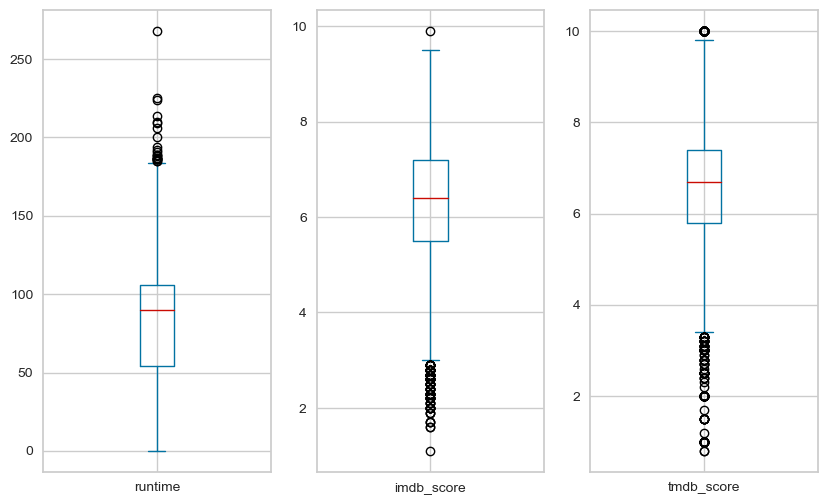

In [39]:
# Gráfico de plot analisando por ano de lançamento, acessos e pontuação dos programas
dfBox=dataSet[["streaming","runtime","imdb_score","tmdb_score"]]
dfBox.plot(kind="box",figsize=(10,6),subplots=True)

In [40]:
# Gráfico de plot melhorado, sobre a pontuação do imdb
grafico = px.box(dataSet, y = "imdb_score")
grafico.show()

In [41]:
# Gráfico de plot melhorado, sobre a pontuação do tmdb
grafico = px.box(dataSet, y = "tmdb_score")
grafico.show()

In [42]:
# Gráfico de plot melhorado, sobre os acessos
grafico = px.box(dataSet, y = "runtime")
grafico.show()

In [43]:
#Verificando os possivéis outliers - acessos
runtime_maior =dataSet[dataSet['runtime'] > 184]
runtime_maior = runtime_maior.reset_index()
runtime_maior[["title","streaming","release_year","imdb_score","tmdb_score"]]

,title,streaming,release_year,imdb_score,tmdb_score
0,Saladin the Victorious,Netflix,1963,7.6,7.100
1,Wyatt Earp,Netflix,1994,6.7,6.751
2,Hum Aapke Hain Koun..!,Netflix,1994,7.5,6.500
3,Titanic,Netflix,1997,7.9,7.878
4,Kuch Kuch Hota Hai,Netflix,1998,7.6,7.700
5,Kabhi Khushi Kabhie Gham,Netflix,2001,7.4,7.900
6,Lagaan: Once Upon a Time in India,Netflix,2001,8.1,7.300
7,Dil Hai Tumhaara,Amazon,2002,5.4,6.000
8,Kal Ho Naa Ho,Netflix,2003,7.9,7.500
9,Swades,Netflix,2004,8.1,7.400


In [44]:
#Verificando os possivéis outliers - tmdb
piores_notas_tmdb=dataSet[dataSet['tmdb_score'] < 3.4]
piores_notas_tmdb=piores_notas_tmdb.reset_index()
piores_notas_tmdb[["title","streaming","release_year","imdb_score","tmdb_score"]]

,title,streaming,release_year,imdb_score,tmdb_score
0,The Luck of Roaring Camp,Amazon,1937,5.9,3.0
1,Sky Racket,Amazon,1937,4.8,2.0
2,Two Weeks to Live,Amazon,1943,5.6,2.0
3,The Slime People,Amazon,1963,2.7,3.2
4,The Next One,Amazon,1984,4.7,1.5
...,...,...,...,...,...
180,Johnny Test's Ultimate Meatloaf Quest,Netflix,2021,7.1,2.5
181,Mommy Issues,Netflix,2021,5.4,1.0
182,"Let's Tie the Knot, Honey!",Netflix,2022,4.4,2.0
183,Sumaira Shaikh: Dongri Danger,Amazon,2022,4.9,1.0


In [45]:
#Verificando os possivéis outliers - tmdb
maiores_notas_tmdb=dataSet[dataSet['tmdb_score'] > 9.8]
maiores_notas_tmdb=maiores_notas_tmdb.reset_index()
maiores_notas_tmdb[["title","streaming","release_year","imdb_score","tmdb_score"]]

,title,streaming,release_year,imdb_score,tmdb_score
0,Brothers O'Toole,Amazon,1973,4.5,10.0
1,Pink Zone,Netflix,2007,5.8,10.0
2,Primal Grill with Steven Raichlen,Amazon,2009,8.0,10.0
3,Alonzo Bodden: Who's Paying Attention,Amazon,2011,7.1,10.0
4,Little Baby Bum,Amazon,2011,6.4,10.0
...,...,...,...,...,...
99,Super PupZ,Netflix,2022,6.6,10.0
100,Lov3,Amazon,2022,5.9,10.0
101,The Big Shot Game Show,Netflix,2022,6.2,10.0
102,Senzo: Murder of a Soccer Star,Netflix,2022,5.2,10.0


In [46]:
#Verificando os possivéis outliers - imdb
piores_notas_imdb=dataSet[dataSet['imdb_score'] < 3]
piores_notas_imdb=piores_notas_imdb.reset_index()
piores_notas_imdb[["title","streaming","release_year","imdb_score","tmdb_score"]]

,title,streaming,release_year,imdb_score,tmdb_score
0,The Slime People,Amazon,1963,2.7,3.2
1,Dostana,Netflix,1980,2.1,4.9
2,Mutants,Amazon,2008,2.3,3.1
3,Attack of the Giant Leeches,Amazon,2008,1.9,3.0
4,Agyaat,Netflix,2009,2.9,4.1
...,...,...,...,...,...
99,365 Days: This Day,Netflix,2022,2.5,5.8
100,"Rodrigo Sant'anna: I'm Here, I'm Queer!",Netflix,2022,2.6,7.5
101,Byron Baes,Netflix,2022,2.6,6.0
102,Hype House,Netflix,2022,2.1,5.8


In [47]:
#Verificando os possivéis outliers - imdb
maiores_notas_imdb=dataSet[dataSet['imdb_score'] > 9.5]
maiores_notas_imdb=maiores_notas_imdb.reset_index()
maiores_notas_imdb[["title","streaming","release_year","imdb_score","tmdb_score"]]

,title,streaming,release_year,imdb_score,tmdb_score
0,Pawankhind,Amazon,2022,9.9,8.5


In [48]:
# Analisando a tabulação cruzada entre os campos do Dataset (type - streaming)
pd.crosstab(dataSet["type"], dataSet["streaming"])

streaming,Amazon,Netflix
type,,
MOVIE,2566,3196
SHOW,442,1823


<AxesSubplot:>

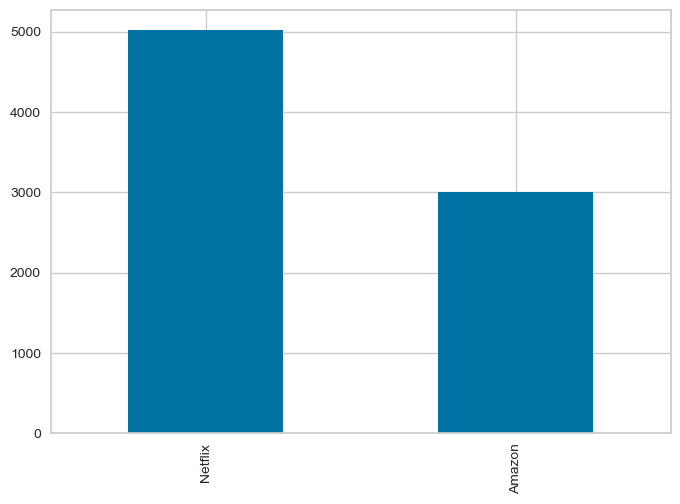

In [49]:
# Gráfico de barra, agrupando por streaming
dataSet['streaming'].value_counts().plot(kind='bar')

#### Gráfico de Pizza separado por Streaming

In [50]:
#parâmetros do gráfico de pizza
kwargs = dict(
    startangle = 90,
    colormap = 'Pastel2',
    fontsize = 13,
    explode = None,
    figsize=(60,5),
    autopct = '%1.1f%%',
    title = 'Streaming'
 )


<AxesSubplot:title={'center':'Streaming'}, ylabel='streaming'>

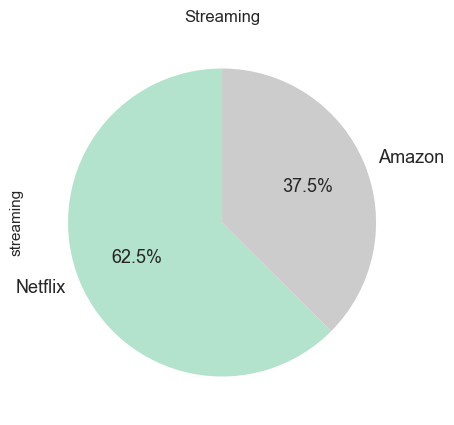

In [51]:
#Gerar o gráfico de pizza
dataSet['streaming'].value_counts().plot.pie(**kwargs)

#### Gráfico de Pizza separado por tipo

In [52]:
#parâmetros do gráfico de pizza
kwargs = dict(
    startangle = 90,
    colormap = 'Pastel2',
    fontsize = 13,
    explode = None,
    figsize=(60,5),
    autopct = '%1.1f%%',
    title = 'Type'
 )

<AxesSubplot:title={'center':'Type'}, ylabel='type'>

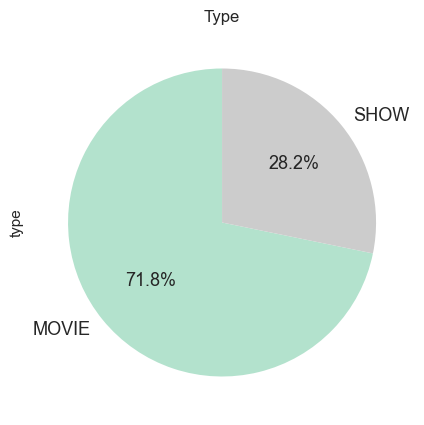

In [53]:
#Gerar o gráfico de pizza
dataSet['type'].value_counts().plot.pie(**kwargs)

## ---------------------------------------------------------------------------------------------------------------------------------

# Análise para Regressão Linear

#### Baseado no aprendizado supervisionado, através da regressão.
#### Objetivo é descobrir a relação entre as 2 grandezes( IMDB e TMDB) para poder realizar previsões futuras
### Vantagens
##### Simples de implementar
##### Prever o futuro
##### Possível realizar ajustes ou pode se aplicar técnicas de dimensionalidade, técnicas de regularização e validação cruzada.
###### .
### Desvantagens
##### Os outliers podem impactar muito a previssão
##### Limitado a relacionamentos lineares
##### Os dados devem ser independentes 
###### Fonte --> https://www.fm2s.com.br/public/blog/regressao-linear

<AxesSubplot:xlabel='imdb_score', ylabel='Probability'>

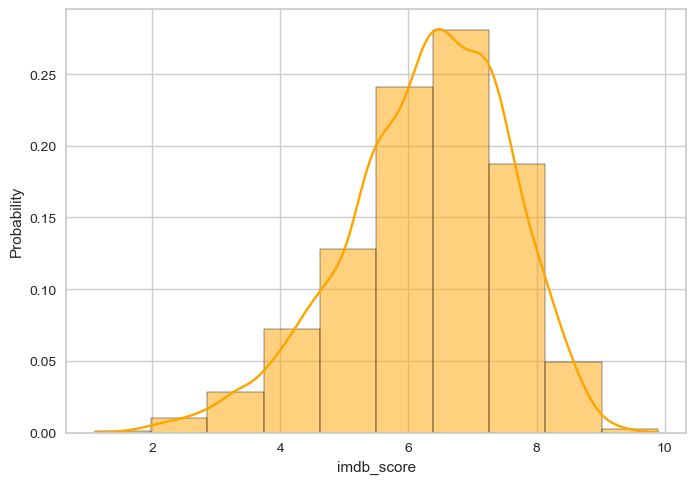

In [54]:
# Gráfico de histograma da pontuação - IMDB
sns.histplot(dataSet,x= "imdb_score", bins=10, color="orange", kde=True,stat="probability")


<AxesSubplot:xlabel='tmdb_score', ylabel='Probability'>

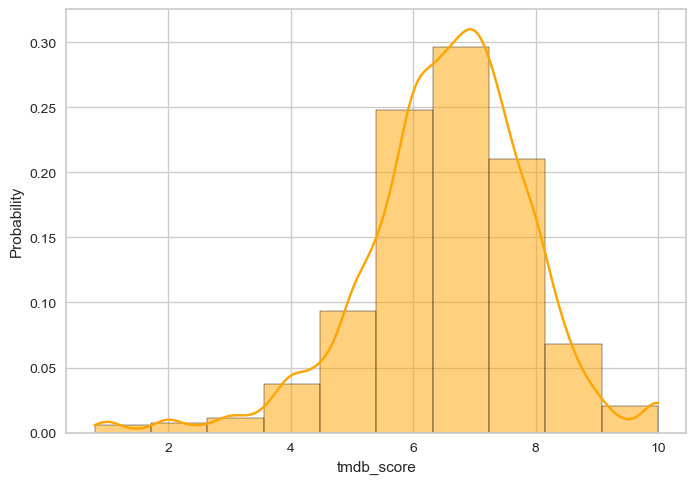

In [55]:
# Gráfico de histograma da pontuação - TMDB
sns.histplot(dataSet,x= "tmdb_score", bins=10, color="orange", kde=True,stat="probability")

In [56]:
# Gráfico de dispersão com base nos paises, pontuação do imdb e o tipo.
fig = px.scatter(dataSet, x = "production_countries",y = "imdb_score" , symbol = 'streaming', color = "type",
                 hover_name = "type", log_x = False, width = 800)
fig.update_traces(marker=dict(size = 12,line = dict(width = 2)),selector=dict(mode = 'markers'))
fig.update_layout(title = 'Tipo de produção por país')
fig.update_xaxes(title = 'Paises')
fig.update_yaxes(title = 'Pontuação')
fig.show()

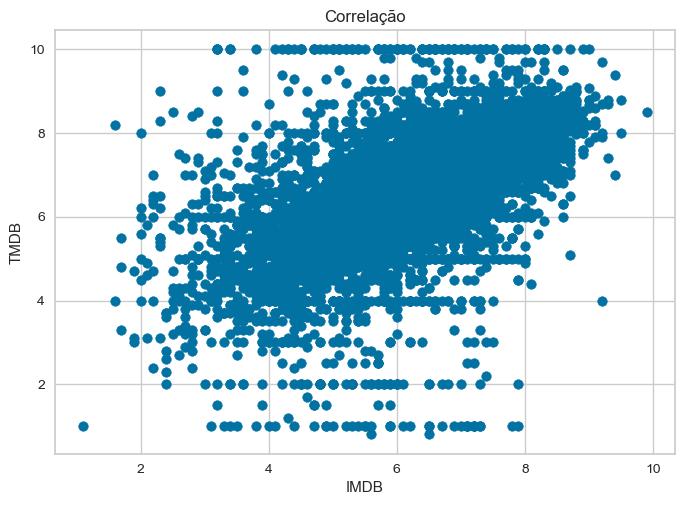

In [57]:
# Correlação entre as pontuações de IMDB e TMDB
plt.scatter(dataSet.imdb_score,dataSet.tmdb_score)
plt.title("Correlação")
plt.xlabel("IMDB")
plt.ylabel("TMDB")
plt.grid(True)
plt.show()

In [58]:
# Criar um Dataframe com apenas os campos nessa análise
dfRegressao = dataSet[["streaming","runtime","imdb_score","imdb_votes","tmdb_score"]]
dfRegressao

,streaming,runtime,imdb_score,imdb_votes,tmdb_score
180,Amazon,63,5.8,251.0,4.4
554,Amazon,78,6.3,810.0,7.2
633,Amazon,66,5.4,412.0,4.2
549,Amazon,74,6.1,532.0,5.7
469,Amazon,82,6.1,478.0,5.2
...,...,...,...,...,...
5598,Netflix,179,6.0,2248.0,6.7
5066,Netflix,100,6.2,3434.0,6.5
5067,Netflix,167,7.3,2563.0,6.2
9058,Amazon,138,7.8,645.0,6.3


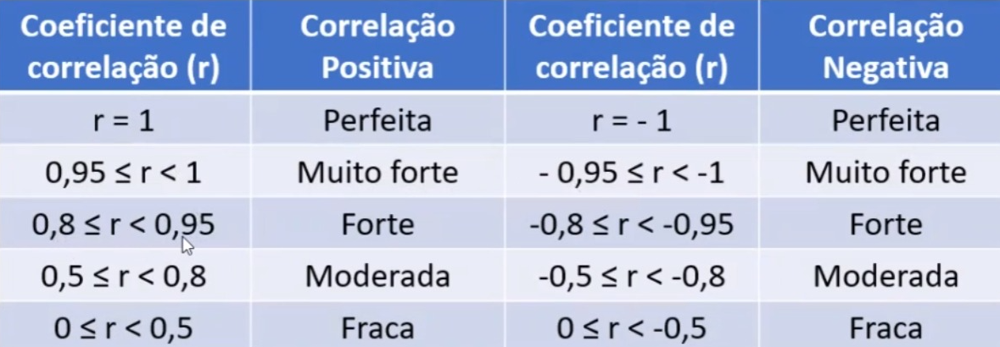

In [59]:
# Avaliar as correlações das grandezas
dataSet.corr()

,release_year,runtime,imdb_score,imdb_votes,tmdb_score
release_year,1.000000,-0.049670,-0.019386,-0.100526,0.095120
runtime,-0.049670,1.000000,-0.160509,0.104245,-0.257727
imdb_score,-0.019386,-0.160509,1.000000,0.188369,0.568936
imdb_votes,-0.100526,0.104245,0.188369,1.000000,0.122148
tmdb_score,0.095120,-0.257727,0.568936,0.122148,1.000000


In [60]:
# Correlação das pontuações (Amazon)
dfNet = dataSet.where(dataSet["streaming"]=="Amazon")
dfNet = dfNet.dropna()
dfNet[["imdb_score","tmdb_score"]].corr()

,imdb_score,tmdb_score
imdb_score,1.000000,0.502499
tmdb_score,0.502499,1.000000


In [61]:
# Correlação das pontuações (Netflix)
dfNet = dataSet.where(dataSet["streaming"]=="Netflix")
dfNet = dfNet.dropna()
dfNet[["imdb_score","tmdb_score"]].corr()

,imdb_score,tmdb_score
imdb_score,1.000000,0.580052
tmdb_score,0.580052,1.000000


In [62]:
# Regressão usando as grandezas imdb_score e tmdb_score
regressao = smf.ols("imdb_score ~ tmdb_score", data =dfRegressao).fit()
print(regressao.summary())

                            OLS Regression Results                            
Dep. Variable:             imdb_score   R-squared:                       0.324
Model:                            OLS   Adj. R-squared:                  0.324
Method:                 Least Squares   F-statistic:                     3841.
Date:                Mon, 06 Feb 2023   Prob (F-statistic):               0.00
Time:                        12:06:13   Log-Likelihood:                -11807.
No. Observations:                8027   AIC:                         2.362e+04
Df Residuals:                    8025   BIC:                         2.363e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.7694      0.058     47.817      0.0

#### No. Observations:8027   | Df Residuals:8025 (grau de liberdade residual) 
#### Df Model:1( grau de liberdade do modelo)
#### R-squared:0.324 (R quadrada) | Adj. R-squared:0.324(R quadrado ajustado - explica a relação entre as grandezas - está baixo. A relação entre a pontuação imdb e a pontuação tmdb é muito pouca.)
#### Coeficiente Linear: Intercept  2.7694  | Coeficiente Angular: tmdb_score  0.5364


In [63]:
# Os Coeficientes (Linear/ Angular)
#O coeficiente linear (intercepto) corresponde ao valor no ponto em que a reta corta o eixo das ordenadas;
#O coeficiente angular corresponde ao valor que dá a inclinação da reta.
coefs = pd.DataFrame(regressao.params)
coefs.columns = ["Os_Coeficientes"]
print(coefs)

            Os_Coeficientes
Intercept          2.769399
tmdb_score         0.536386


#### A formula preve a pontuação IMDB  será coef Linear mas coef Angular vezes tmdb_score

##### Equação:
##### pontuacao = 2.704895 + 0.555220 x tmdb_Score

In [64]:
# Previssão para cada um dos valores do imdb com base no valor do tmdb
regressao.predict()

array([5.1294966 , 6.63137705, 5.02221943, ..., 6.09499118, 6.14862976,
       5.93407541])

In [65]:
# Residuo é distancia entre os dados e a reta ajustada. Mostra a distancia que o valor está da reta ajustada (reta de regressão)
residuos = regressao.resid
residuos

180     0.670503
554    -0.331377
633     0.377781
549     0.273202
469     0.541395
          ...   
5598   -0.363184
5066   -0.055907
5067    1.205009
9058    1.651370
4708   -1.334075
Length: 8027, dtype: float64

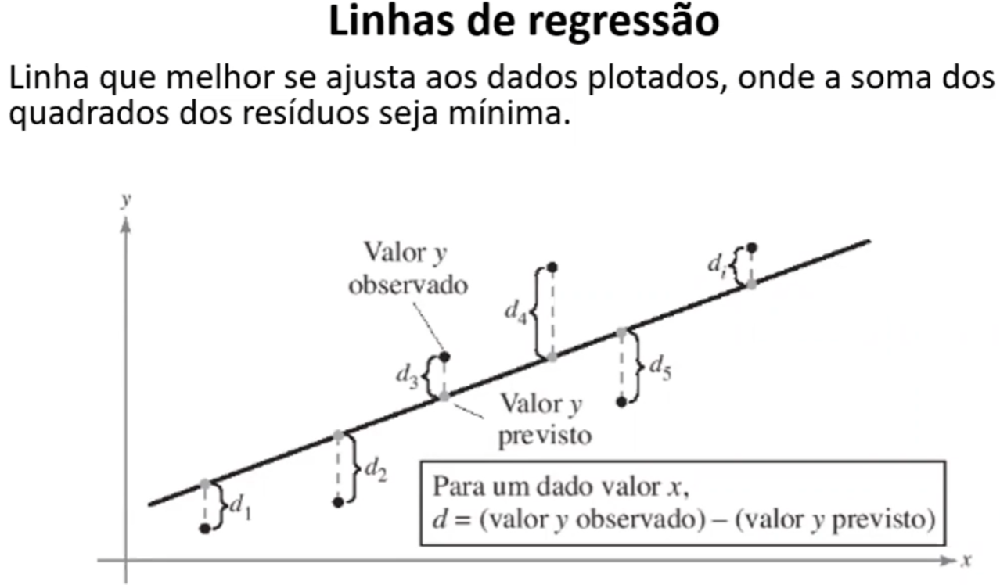

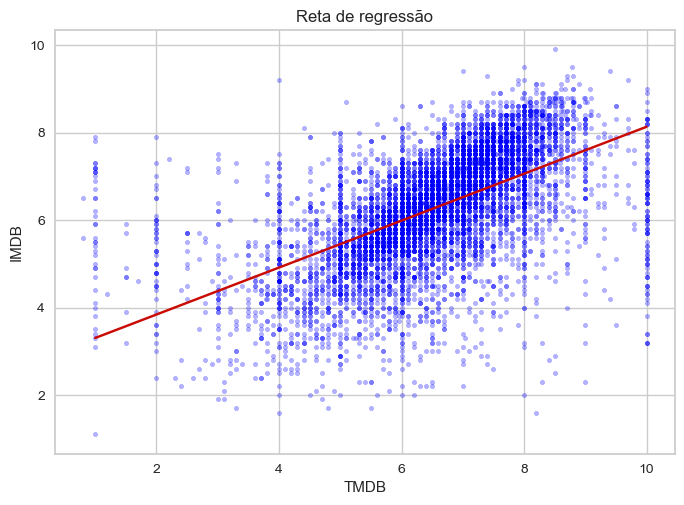

In [66]:
# Gerar o gráfico da Reta de Regressão
plt.scatter(y=dfRegressao.imdb_score,x=dfRegressao.tmdb_score, color='blue', s=10, alpha=.3)
#X_plot = np.linspace(min(dfRegressao.tmdb_score), max(dfRegressao.tmdb_score), len(dfRegressao.tmdb_score))
X_plot = np.linspace(1,10)
plt.plot(X_plot, X_plot*regressao.params[1] + regressao.params[0], color='r')
plt.title('Reta de regressão')
plt.ylabel('IMDB')
plt.xlabel('TMDB')
plt.show()

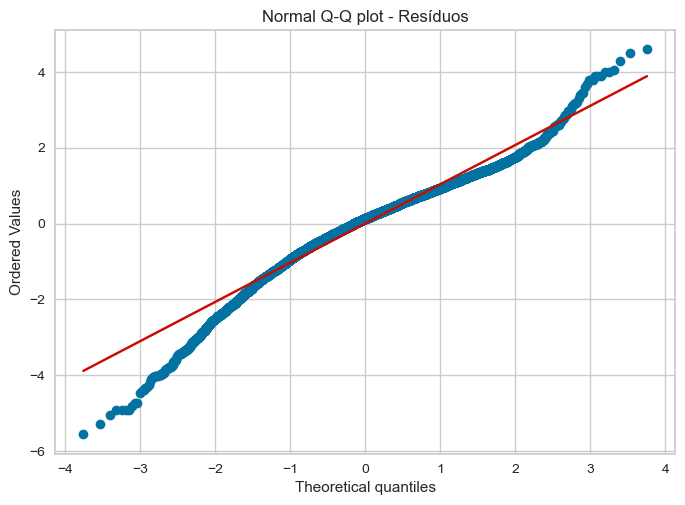

In [67]:
# É uma Distribuíção normal - para ser distribuição normal eles precisam concindir com a linha vermelha.
# Consegue realizar uma previsão boa nos valores do meio da reta, mas erra muito nas extremidades
stats.probplot(residuos, dist="norm", plot=plt)
plt.title("Normal Q-Q plot - Resíduos")
plt.show()

In [68]:
# Teste de Shapiro-Wilk
# Nível de significância de 0,05 ou 5%
# Quando p > 0,05(Distribuição normal)
# Teste de Normalidade dos resíduos - pvalue > 0.05 para ter uma distribuição normal (Para elementos menor que 5000)
stats.shapiro(residuos)


C:\PUC\ANACONDA\lib\site-packages\scipy\stats\_morestats.py:1800: UserWarning:

p-value may not be accurate for N > 5000.



ShapiroResult(statistic=0.9657446146011353, pvalue=6.8007396681072725e-40)

In [69]:
# Teste Lilliefors
#o teste de Shapiro-Wilk teve como resultado W = 0,98105, p = 0,0306. 
#Assim, nossos erros não são aleatórios e não há homogeneidade de variância dos resíduos.
statsmodels.stats.diagnostic.lilliefors(dataSet.imdb_score, dist="norm")

(0.05887773223296189, 0.0009999999999998899)

In [70]:
# Teste de normalidade de Anderson
ad_stat, ad_critico, ad_teorico = stats.anderson(residuos, 'norm')
print("O Valor da estatística calculada: " ,ad_stat)
print("Os valores críticos: ",ad_critico)
print("Os níveis de significancia: ",ad_teorico)


O Valor da estatística calculada:  66.51603506568972
Os valores críticos:  [0.576 0.656 0.787 0.918 1.091]
Os níveis de significancia:  [15.  10.   5.   2.5  1. ]


In [71]:
#Verificar se é uma distribuição normal pelo teste de Anderson
if ad_stat < ad_critico[2]:
    print("Com " + str(100 - ad_teorico[2]) + "% de confiança, os dados são similares a uma distribuição normal" 
          +"segundo o teste de AD")
else:
    print("Com " + str(100 - ad_teorico[2]) + "% de confiança, os dados não são similares a uma distribuição normal" 
          +"segundo o teste de AD")

Com 95.0% de confiança, os dados não são similares a uma distribuição normalsegundo o teste de AD


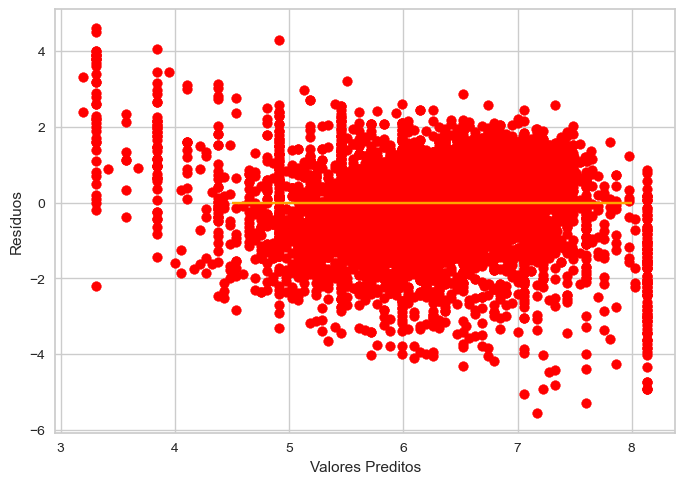

In [72]:
# Análise da Homocedasticidade dos resíduos
# Variação constante dos resíduos, além da distruição normal
# Tem que gerar algo parecido com um retangulo
#Ao analisar o gráfico acima, é possível perceber que os resíduos não são homogêneos para todos os valores de Y
# São mais homogeneos nos intervalos de x entre 5 e 7,5. Mais ou menos
plt.scatter(y=residuos, x=regressao.predict(), color='red')
plt.hlines(y=0, xmin=4.5, xmax=8, color='orange')
plt.ylabel('Resíduos')
plt.xlabel('Valores Preditos')
plt.show()

### O modelo de regressão Linear não é recomendado pois os dados não se comportam como uma distribuição normal, falhou nos testes estatísticos, obtendo pvalor menor que 0,05,  a raiz quadrada deu um valor muiot baixo no limite, mostrando que nao existem uma boa relação entre as grandezas avaliadas. 

## ---------------------------------------------------------------------------------------------------------------------------------

# =============================================================

## ---------------------------------------------------------------------------------------------------------------------------------

# Modelo de Naive Bayes

#### Baseado na construção de classificadores, rótulos de classe representados como  vetores.
#### Pressupõe que o valor de um recurso é independente do outro recurso, alterar o valor de um recurso não afetaria o valor do outro recurso.
#### Recomendado para grandes volumes de dados, previsão em tempo real (Mais rápido e está sempre pronto para aprender)
#### Previsão de várias classes ( A probabilidade de várias classes de qualquer variável de destino pode ser prevista usando um algoritmo Naive Bayes)
#### Sistema de recomendação (O classificador Naive Bayes, com a ajuda da Filtragem colaborativa, cria um sistema de recomendação.)
#### Classificação do texto / Análise de sentimentos / Filtragem de spam:Devido ao seu melhor desempenho com problemas de várias classes e à sua regra de independência, o algoritmo Naive Bayes tem um desempenho melhor ou tem uma maior taxa de sucesso na classificação de texto.
### Vantagens
##### Fácil de implementar.
##### Rápido
##### Se a suposição de independência se mantiver, ela funcionará com mais eficiência do que outros algoritmos.
##### Requer menos dados de treinamento.
##### É altamente escalável.
##### Pode fazer previsões probabilísticas.
##### Pode lidar com dados contínuos e discretos.
##### Insensível a características irrelevantes.
##### Pode funcionar facilmente com valores ausentes.
##### Fácil de atualizar na chegada de novos dados.
##### Mais adequado para problemas de classificação de texto.
###### .
### Desvantagens
##### A forte suposição de que os recursos são independentes, o que dificilmente se aplica às aplicações da vida real.
##### Escassez de dados.
##### Chances de perda de precisão.
##### Freqüência zero, isto é, se a categoria de qualquer variável categórica não for vista no conjunto de dados de treinamento, o modelo atribuirá uma probabilidade zero a essa categoria e, portanto, uma previsão não poderá ser feita.
###### Fonte --> https://pt.education-wiki.com/4576960-naive-bayes-algorithm#:~:text=Neste%20artigo%2C%20aprendemos%20os%20conceitos%20do%20algoritmo%20Naive,n%C3%A3o%20%C3%A9%20verdade%20nas%20aplica%C3%A7%C3%B5es%20da%20vida%20real.

In [73]:
#Filtrar os campos do dataser que iremos usar no treinamento
dataSet = dataSet[["runtime","genres","imdb_score","imdb_votes","tmdb_score","Status"]]
dataSet

,runtime,genres,imdb_score,imdb_votes,tmdb_score,Status
180,63,"comedy,fantasy",5.8,251.0,4.4,Ruim
554,78,"romance,drama",6.3,810.0,7.2,Ruim
633,66,"crime, thriller,drama",5.4,412.0,4.2,Ruim
549,74,drama,6.1,532.0,5.7,Ruim
469,82,"drama,romance",6.1,478.0,5.2,Ruim
...,...,...,...,...,...,...
5598,179,"crime,drama",6.0,2248.0,6.7,Ruim
5066,100,"crime, drama, thriller,action",6.2,3434.0,6.5,Ruim
5067,167,"comedy, fantasy, romance, sport,drama",7.3,2563.0,6.2,Bom
9058,138,"action, crime,drama",7.8,645.0,6.3,Bom


In [74]:
# Separar as previssões da classificação (Status)
previsores = dataSet.iloc[:,0:5].values
classe = dataSet.iloc[:,5].values

In [75]:
#Visualizar os dados da variável previsores
previsores

array([[63, ' comedy,fantasy', 5.8, 251.0, 4.4],
       [78, ' romance,drama', 6.3, 810.0, 7.2],
       [66, ' crime, thriller,drama', 5.4, 412.0, 4.2],
       ...,
       [167, ' comedy, fantasy, romance, sport,drama', 7.3, 2563.0, 6.2],
       [138, ' action, crime,drama', 7.8, 645.0, 6.3],
       [83, ' drama,horror', 4.6, 4583.0, 5.9]], dtype=object)

In [76]:
#Visualizar as classificações
classe

array(['Ruim', 'Ruim', 'Ruim', ..., 'Bom', 'Bom', 'Ruim'], dtype=object)

In [77]:
# Transformação dos atributos categóricos em atributos numéricos, passando o índice de cada coluna categórica
labelencoder1 = LabelEncoder()
previsores[:,1] = labelencoder1.fit_transform(previsores[:,1])

In [78]:
#Criar as variáveis para treinamento
x_treinamento, x_teste,y_treinamento, y_teste = train_test_split(previsores,classe,test_size= 0.3, random_state=0)
x_teste

array([[90, 1685, 6.1, 3220.0, 5.6],
       [54, 1011, 8.4, 77885.0, 8.0],
       [93, 337, 6.7, 33051.0, 7.4],
       ...,
       [110, 1688, 3.6, 88.0, 2.0],
       [134, 442, 4.2, 73228.0, 5.9],
       [21, 1011, 7.2, 4528.0, 7.7]], dtype=object)

In [79]:
#Visualizar as variáveis 
print('X_Treinamento',x_treinamento)
print('x_teste',x_teste)
print('y_treinamento',y_treinamento)
print('y_teste',y_teste)

X_Treinamento [[166 1430 6.7 2062.0 6.1]
 [9 763 7.4 586.0 7.4]
 [35 1687 7.8 1313.0 7.2]
 ...
 [159 987 7.3 15216.0 7.0]
 [110 65 6.4 147.0 6.7]
 [95 1288 6.4 1069.0 6.2]]
x_teste [[90 1685 6.1 3220.0 5.6]
 [54 1011 8.4 77885.0 8.0]
 [93 337 6.7 33051.0 7.4]
 ...
 [110 1688 3.6 88.0 2.0]
 [134 442 4.2 73228.0 5.9]
 [21 1011 7.2 4528.0 7.7]]
y_treinamento ['Ruim' 'Ruim' 'Ruim' ... 'Bom' 'Ruim' 'Ruim']
y_teste ['Ruim' 'Ruim' 'Ruim' ... 'Ruim' 'Ruim' 'Ruim']


In [80]:
# Criação e treinamento do modelo
naive_bayes = GaussianNB()
naive_bayes.fit(x_treinamento, y_treinamento)

GaussianNB()

In [81]:
# Previssões utilizando os registros de teste
previsoes = naive_bayes.predict(x_teste)
previsoes

array(['Ruim', 'Ruim', 'Ruim', ..., 'Ruim', 'Ruim', 'Ruim'], dtype='<U4')

In [82]:
# Geração da matriz de confusão e cálculo da taxa de acerto e erro
confusao = confusion_matrix(y_teste, previsoes)
confusao

array([[  30,  273],
       [  18, 2088]], dtype=int64)

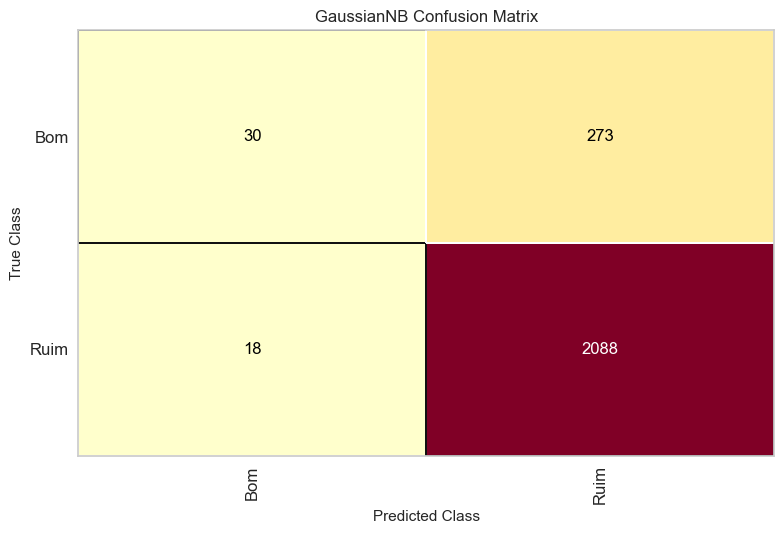

<AxesSubplot:title={'center':'GaussianNB Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [83]:
#Visualização da matriz de confusão
v = ConfusionMatrix(GaussianNB())
v.fit(x_treinamento,y_treinamento)
v.score(x_teste, y_teste)
v.poof()


In [84]:
#Taxade acerto
taxa_acerto = accuracy_score(y_teste,previsoes)
taxa_erro = 1 - taxa_acerto
taxa_acerto

0.8792029887920298

In [85]:
# Preparar a nova carga
dfNovaCarga = dfNovaCarga[["runtime","genres","imdb_score","imdb_votes","tmdb_score"]]
dfNovaCarga

,runtime,genres,imdb_score,imdb_votes,tmdb_score
0,102,"fantasy, family",8.1,389774.0,7.6
1,119,drama,8.3,433804.0,8.0
2,102,"drama, romance, war",8.5,558849.0,8.2
3,116,"thriller, crime",7.9,84494.0,7.7
4,100,"thriller, romance, crime",8.0,156603.0,7.8
...,...,...,...,...,...
3257,40,documentation,3.7,184.0,5.9
3275,106,"crime, drama, thriller",6.3,27.0,5.9
3279,26,animation,6.8,14.0,10.0
3283,58,comedy,3.8,224.0,5.4


In [86]:
# Previsão com novo registro, transforma os atributos categóricos em numéricos.
dfNovaCarga = dfNovaCarga.iloc[:,0:5].values
dfNovaCarga

array([[102, 'fantasy, family', 8.1, 389774.0, 7.6],
       [119, 'drama', 8.3, 433804.0, 8.0],
       [102, 'drama, romance, war', 8.5, 558849.0, 8.2],
       ...,
       [26, 'animation', 6.8, 14.0, 10.0],
       [58, 'comedy', 3.8, 224.0, 5.4],
       [90, 'comedy', 5.9, 50.0, 2.0]], dtype=object)

In [87]:
# Transformação dos atributos categóricos em atributos numéricos, passando o índice de cada coluna categórica
labelencoder1 = LabelEncoder()
dfNovaCarga[:,1] = labelencoder1.fit_transform(dfNovaCarga[:,1])


In [88]:
#Inserir nova carga no modelo para prever os resultados
result=naive_bayes.predict(dfNovaCarga)
result

array(['Bom', 'Bom', 'Bom', ..., 'Ruim', 'Ruim', 'Ruim'], dtype='<U4')

In [89]:
# Visualizar o dataset
dfResult

,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score
0,The Wizard of Oz,MOVIE,1939,102,"fantasy, family",US,8.1,389774.0,7.6
1,Citizen Kane,MOVIE,1941,119,drama,US,8.3,433804.0,8.0
2,Casablanca,MOVIE,1942,102,"drama, romance, war",US,8.5,558849.0,8.2
3,The Big Sleep,MOVIE,1946,116,"thriller, crime",US,7.9,84494.0,7.7
4,The Maltese Falcon,MOVIE,1941,100,"thriller, romance, crime",US,8.0,156603.0,7.8
...,...,...,...,...,...,...,...,...,...
3257,Covid Diaries NYC,MOVIE,2021,40,documentation,US,3.7,184.0,5.9
3275,Breathless,MOVIE,2021,106,"crime, drama, thriller",DO,6.3,27.0,5.9
3279,Furry Friends Forever: Elmo Gets a Puppy,MOVIE,2021,26,animation,US,6.8,14.0,10.0
3283,Marlon Wayans: You Know What It Is,MOVIE,2021,58,comedy,US,3.8,224.0,5.4


In [90]:
#Adicionar ao final do dataset o resultado das previsões
dfResult['Status'] = result.tolist()

In [91]:
#Visualizar o dataset
dfResult

,title,type,release_year,runtime,genres,production_countries,imdb_score,imdb_votes,tmdb_score,Status
0,The Wizard of Oz,MOVIE,1939,102,"fantasy, family",US,8.1,389774.0,7.6,Bom
1,Citizen Kane,MOVIE,1941,119,drama,US,8.3,433804.0,8.0,Bom
2,Casablanca,MOVIE,1942,102,"drama, romance, war",US,8.5,558849.0,8.2,Bom
3,The Big Sleep,MOVIE,1946,116,"thriller, crime",US,7.9,84494.0,7.7,Ruim
4,The Maltese Falcon,MOVIE,1941,100,"thriller, romance, crime",US,8.0,156603.0,7.8,Bom
...,...,...,...,...,...,...,...,...,...,...
3257,Covid Diaries NYC,MOVIE,2021,40,documentation,US,3.7,184.0,5.9,Ruim
3275,Breathless,MOVIE,2021,106,"crime, drama, thriller",DO,6.3,27.0,5.9,Ruim
3279,Furry Friends Forever: Elmo Gets a Puppy,MOVIE,2021,26,animation,US,6.8,14.0,10.0,Ruim
3283,Marlon Wayans: You Know What It Is,MOVIE,2021,58,comedy,US,3.8,224.0,5.4,Ruim


### O modelo de Naive Bayes tem uma taxa de acerto de 0.87 ( 87%) de acerto, o que é uma boa taxa com baixa taxa de erro em apenas um dos quadrantes.

## ---------------------------------------------------------------------------------------------------------------------------------

# ===================Árvore de decisão==========================

## ---------------------------------------------------------------------------------------------------------------------------------

# Modelo Árvore de decisão - Foi superior ao modelo de Naive Bayers

#### Aprendizado de máquina supervisionado, que usa algoritmos de classificação e regressão.
#### Consiste de nós, nó-raiz e nós-folha.
#### Funciona de maneira recursiva, analisando cada novo nó.
#### Índice GINI :Com o cálculo do índice GINI,  será verificada a distribuição dos dados nas variáveis preditoras de acordo com a variação da variável target, porém com um método diferente.A variável preditora com o menor índice Gini será a escolhida para o nó principal da árvore, pois um baixo valor do índice indica maior ordem na distribuição dos dados.
#### É um modelo preditivo de alta precisão, estabilidade e facilidade de interpretação.
#### Funciona muito bem em relações não-lineares.
### Vantagens
##### Fácil de entender: A visualização de uma árvore de decisão torna o problema fácil de compreender, mesmo para pessoas que não tenham perfil analítico. Não requer nenhum conhecimento estatístico para ler e interpretar. Sua representação gráfica é muito intuitiva e permite relacionar as hipóteses também facilmente.
##### Útil em exploração de dados: A árvore de decisão é uma das formas mais rápidas de identificar as variáveis mais significativas e a relação entre duas ou mais variáveis. Com a ajuda de árvores de decisão, podemos criar novas variáveis/características que tenham melhores condições de predizer a variável alvo. 
##### Menor necessidade de limpar dados: Requer menos limpeza de dados em comparação com outras técnicas de modelagem. Até um certo nível, não é influenciado por pontos fora da curva “outliers” nem por valores faltantes (“missing values”).
##### Não é restrito por tipos de dados: Pode manipular variáveis numéricas e categóricas.
##### Método não paramétrico: A árvore de decisão é considerada um método não-paramétrico. Isto significa que as árvores de decisão não pressupõem a distribuição do espaço nem a estrutura do classificador.
###### .
### Desvantagens
##### Sobreajuste (“Over fitting”): Sobreajuste é uma das maiores dificuldades para os modelos de árvores de decisão. Este problema é resolvido através da definição de restrições sobre os parâmetros do modelo e da poda (discutido em mais detalhes abaixo).
##### Não adequado para variáveis contínuas: ao trabalhar com variáveis numéricas contínuas, a árvore de decisão perde informações quando categoriza variáveis em diferentes categorias.
###### Fonte -->https://didatica.tech/como-funciona-o-algoritmo-arvore-de-decisao/
###### Fonte -->https://www.vooo.pro/insights/um-tutorial-completo-sobre-a-modelagem-baseada-em-tree-arvore-do-zero-em-r-python/

In [92]:
# Separar as previssões da classificação (Status)
previsores = dataSet.iloc[:,0:5].values
classe = dataSet.iloc[:,5].values

In [93]:
# Transformação dos atributos categóricos em atributos numéricos, passando o índice de cada coluna categórica
labelencoder2 = LabelEncoder()
previsores[:,1] = labelencoder2.fit_transform(previsores[:,1])


In [94]:
#Visualizar os valores dos previsores
previsores

array([[63, 1013, 5.8, 251.0, 4.4],
       [78, 1641, 6.3, 810.0, 7.2],
       [66, 1154, 5.4, 412.0, 4.2],
       ...,
       [167, 938, 7.3, 2563.0, 6.2],
       [138, 376, 7.8, 645.0, 6.3],
       [83, 1464, 4.6, 4583.0, 5.9]], dtype=object)

In [95]:
#Visualizar os valores das classificações
classe

array(['Ruim', 'Ruim', 'Ruim', ..., 'Bom', 'Bom', 'Ruim'], dtype=object)

In [96]:
#Criar as variáveis para treinamento
x_treinamento, x_teste,y_treinamento, y_teste = train_test_split(previsores,classe,test_size= 0.3, random_state=0)
x_teste

array([[90, 1685, 6.1, 3220.0, 5.6],
       [54, 1011, 8.4, 77885.0, 8.0],
       [93, 337, 6.7, 33051.0, 7.4],
       ...,
       [110, 1688, 3.6, 88.0, 2.0],
       [134, 442, 4.2, 73228.0, 5.9],
       [21, 1011, 7.2, 4528.0, 7.7]], dtype=object)

In [97]:
#Visualizar as variáveis 
print('X_Treinamento',x_treinamento)
print('x_teste',x_teste)
print('y_treinamento',y_treinamento)
print('y_teste',y_teste)

X_Treinamento [[166 1430 6.7 2062.0 6.1]
 [9 763 7.4 586.0 7.4]
 [35 1687 7.8 1313.0 7.2]
 ...
 [159 987 7.3 15216.0 7.0]
 [110 65 6.4 147.0 6.7]
 [95 1288 6.4 1069.0 6.2]]
x_teste [[90 1685 6.1 3220.0 5.6]
 [54 1011 8.4 77885.0 8.0]
 [93 337 6.7 33051.0 7.4]
 ...
 [110 1688 3.6 88.0 2.0]
 [134 442 4.2 73228.0 5.9]
 [21 1011 7.2 4528.0 7.7]]
y_treinamento ['Ruim' 'Ruim' 'Ruim' ... 'Bom' 'Ruim' 'Ruim']
y_teste ['Ruim' 'Ruim' 'Ruim' ... 'Ruim' 'Ruim' 'Ruim']


In [98]:
#Criação e treinamento do modelo - Árvore de decisão
arvore = DecisionTreeClassifier(
                                max_depth = None,
                                max_features = None,
                                min_samples_leaf=1,
                                min_samples_split=2
)
arvore.fit(x_treinamento, y_treinamento)


DecisionTreeClassifier()

In [99]:
# Exportação da árvore de decisão para o formato .dot, para posterior visualização
previsores_arvore= ['runtime','genres','imdb_score','imdb_vote','tmdb_score']
export_graphviz(arvore, feature_names=previsores_arvore,out_file='tree.dot')
arquivo = 'tree.dot'

In [100]:
#atributos da árvore de decisão, os que tem maior valor representam maior ganho de informação. Importante.
arvore.feature_importances_

array([0.48137077, 0.        , 0.30025252, 0.17756497, 0.04081175])

In [101]:
#Atributos da árvore
#atributos da árvore de decisão, os que tem maior valor 
#representam maior ganho de informação. Importante.
print('Runtime    X[0]-->',arvore.feature_importances_[0])
print('genres     X[1]-->',arvore.feature_importances_[1])
print('imdb_score X[2]-->',arvore.feature_importances_[2])
print('imdb_votes X[3]-->',arvore.feature_importances_[3])
print('tmdb_score X[4]-->',arvore.feature_importances_[4])

Runtime    X[0]--> 0.48137076696590986
genres     X[1]--> 0.0
imdb_score X[2]--> 0.30025251796863334
imdb_votes X[3]--> 0.1775649679462195
tmdb_score X[4]--> 0.04081174711923726


[Text(0.2857142857142857, 0.9, 'imdb_score <= 6.95\ngini = 0.227\nsamples = 5618\nvalue = [734, 4884]'),
 Text(0.14285714285714285, 0.7, 'gini = 0.0\nsamples = 3744\nvalue = [0, 3744]'),
 Text(0.42857142857142855, 0.7, 'runtime <= 69.5\ngini = 0.477\nsamples = 1874\nvalue = [734, 1140]'),
 Text(0.2857142857142857, 0.5, 'gini = 0.0\nsamples = 968\nvalue = [0, 968]'),
 Text(0.5714285714285714, 0.5, 'imdb_vote <= 399.5\ngini = 0.308\nsamples = 906\nvalue = [734, 172]'),
 Text(0.42857142857142855, 0.3, 'gini = 0.0\nsamples = 145\nvalue = [0, 145]'),
 Text(0.7142857142857143, 0.3, 'tmdb_score <= 5.95\ngini = 0.068\nsamples = 761\nvalue = [734, 27]'),
 Text(0.5714285714285714, 0.1, 'gini = 0.0\nsamples = 27\nvalue = [0, 27]'),
 Text(0.8571428571428571, 0.1, 'gini = 0.0\nsamples = 734\nvalue = [734, 0]')]

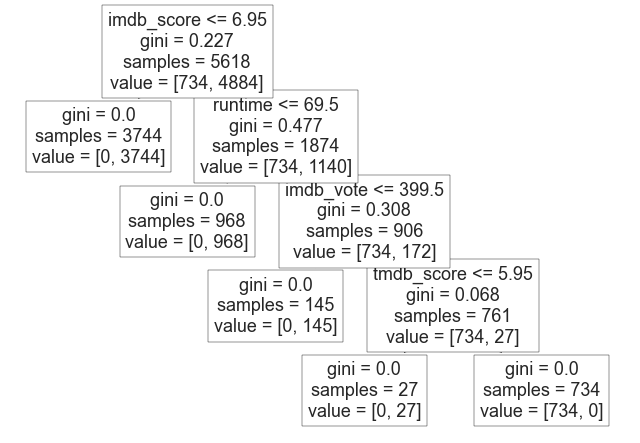

In [102]:
# Mostrar atributos e a árvore
previsores_arvore= ['runtime','genres','imdb_score','imdb_vote','tmdb_score']
tree.plot_tree(arvore, feature_names=previsores_arvore)

In [103]:
# Gerando o gráfico da árvore de decisão
# https://dreampuf.github.io/GraphvizOnline/

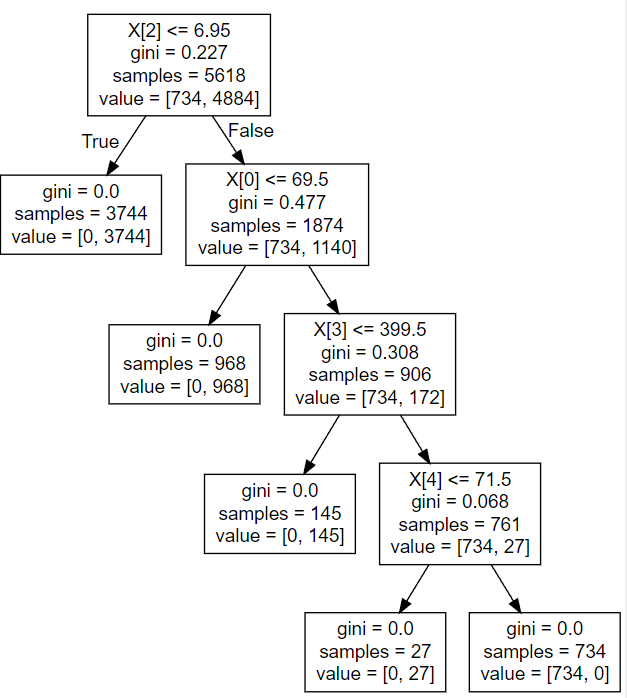

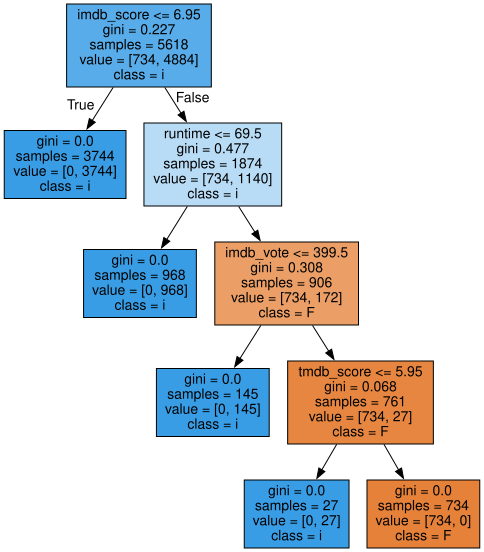

In [104]:
dot_data = tree.export_graphviz(arvore, out_file=None, 
                                feature_names=previsores_arvore,  
                                class_names='Filmes_Series',
                                filled=True)

# Draw graph
graph = graphviz.Source(dot_data, format="png") 
graph

In [105]:
# obtenção das previsões
previsoes=arvore.predict(x_teste)
previsoes

array(['Ruim', 'Ruim', 'Ruim', ..., 'Ruim', 'Ruim', 'Ruim'], dtype=object)

In [106]:
#Acurácia
print('Acurácia: %.4f' %accuracy_score(y_teste,previsoes))

Acurácia: 1.0000


In [107]:
# matriz de confusão - mostra os acertos e os erros.
confusao = confusion_matrix(y_teste, previsoes)
confusao

array([[ 303,    0],
       [   0, 2106]], dtype=int64)

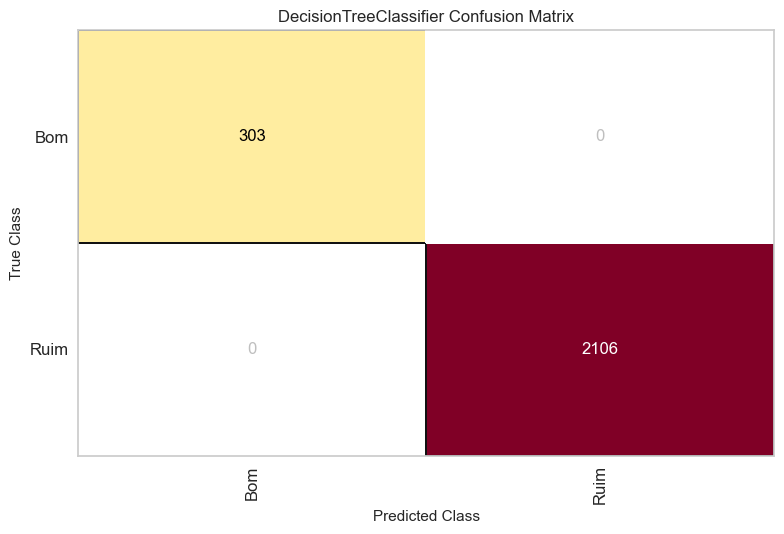

<AxesSubplot:title={'center':'DecisionTreeClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [108]:
#Visualização da matriz de confusão
v = ConfusionMatrix(DecisionTreeClassifier())
v.fit(x_treinamento,y_treinamento)
v.score(x_teste, y_teste)
v.poof()

In [109]:
# taxa de acerto - é superior ao modelo de Naive Bayers
taxa_acerto = accuracy_score(y_teste, previsoes)
taxa_acerto

1.0

In [110]:
# taxa de erro
taxa_erro = 1 - taxa_acerto
taxa_erro

0.0

### O modelo de Árvore de decisão, baseado em classificação, apresentou uma taxa de acerto de 1.0 (100%) e poucos nos de decisão, sendo apenas 3, o que não chegou a ser um overfiting

## ---------------------------------------------------------------------------------------------------------------------------------

# ================= Random Forest=================

## ---------------------------------------------------------------------------------------------------------------------------------

#### Consiste em gerar vários modelos, evitando assim o overfitting.
#### Cria de forma aleatória várias Árvores de Decisão e combina o resultado de todas elas para chegar no resultado final.
#### Muito usado no setor bancário, mercado financeiro, Hospitalar e comércio eletrônico.
### Vantagens
##### Retorna de maneira muito compreensiva a importância atribuída para cada variável independente.
##### Pode ser usada para regressão e para classificação.
##### Muito fácil de implementar, geralmente produz bons resultados
##### Se houver árvores suficiente na floresta, o classificador não ira sobreajustar o modelo e gerar overfitting.
### Desvantagens
##### Quantidade grande de árvores pode deixar o algoritmo lento e ineficiente para predições em tempo real.
##### Para maior acurácia, precisa de mais árvores, o que faz o modelo ficar mais lento.
#####  Ferramenta de modelagem preditiva e não descritiva.

###### Fonte -->https://link.springer.com/article/10.1023/A:1010933404324
###### Fonte -->https://medium.com/machina-sapiens/o-algoritmo-da-floresta-aleat%C3%B3ria-3545f6babdf8

In [111]:
# Separar as previssões da classe (Status)
previsores = dataSet.iloc[:,0:5].values
classe = dataSet.iloc[:,5].values

# Transformação dos atributos categóricos em atributos numéricos, passando o índice de cada atributo categórico
labelencoder = LabelEncoder()
previsores[:,1] = labelencoder.fit_transform(previsores[:,1])


# Divisão da base de dados entre treinamento e de teste (30% para testar e 70% para treinar)
x_treinamento, x_teste,y_treinamento, y_teste = train_test_split(previsores,classe,test_size= 0.3, random_state=1)
x_teste

array([[65, 317, 7.6, 27.0, 7.754],
       [95, 788, 7.3, 21.0, 5.3],
       [85, 1688, 7.2, 773.0, 7.8],
       ...,
       [78, 1233, 7.5, 1987.0, 10.0],
       [104, 1458, 5.9, 6676.0, 6.3],
       [52, 1459, 7.3, 3335.0, 8.2]], dtype=object)

In [112]:
#Visualizar as variáveis 
print('X_Treinamento',x_treinamento)
print('x_teste',x_teste)
print('y_treinamento',y_treinamento)
print('y_teste',y_teste)

X_Treinamento [[90 1597 4.5 1033.0 5.3]
 [134 1154 6.2 4153.0 4.6]
 [135 559 5.2 19493.0 5.3]
 ...
 [4 744 5.2 43.0 7.2]
 [72 1209 6.6 276.0 6.0]
 [32 1523 3.4 10097.0 6.5]]
x_teste [[65 317 7.6 27.0 7.754]
 [95 788 7.3 21.0 5.3]
 [85 1688 7.2 773.0 7.8]
 ...
 [78 1233 7.5 1987.0 10.0]
 [104 1458 5.9 6676.0 6.3]
 [52 1459 7.3 3335.0 8.2]]
y_treinamento ['Ruim' 'Ruim' 'Ruim' ... 'Ruim' 'Ruim' 'Ruim']
y_teste ['Ruim' 'Ruim' 'Bom' ... 'Bom' 'Ruim' 'Ruim']


In [113]:
# Visualizar os valores das previsões
previsores

array([[63, 1013, 5.8, 251.0, 4.4],
       [78, 1641, 6.3, 810.0, 7.2],
       [66, 1154, 5.4, 412.0, 4.2],
       ...,
       [167, 938, 7.3, 2563.0, 6.2],
       [138, 376, 7.8, 645.0, 6.3],
       [83, 1464, 4.6, 4583.0, 5.9]], dtype=object)

In [114]:
# Visualizar os valores das classificações
classe

array(['Ruim', 'Ruim', 'Ruim', ..., 'Bom', 'Bom', 'Ruim'], dtype=object)

In [115]:
# Criação do modelo, treinamento, obtenção das previsões e da taxa de acerto
floresta = RandomForestClassifier(n_estimators=100)
floresta.fit(x_treinamento, y_treinamento)

RandomForestClassifier()

In [116]:
#atributos da rondom forest, maiores valores tem maior ganho 
#de informação. Mais importante.
floresta.feature_importances_

array([0.42645961, 0.01083667, 0.34238985, 0.12537912, 0.09493475])

In [117]:
#Atributos da árvore
#runtime	genres	imdb_score	imdb_votes	tmdb_score
print('Runtime    X[0]-->',floresta.feature_importances_[0])
print('genres     X[1]-->',floresta.feature_importances_[1])
print('imdb_score X[2]-->',floresta.feature_importances_[2])
print('imdb_votes X[3]-->',floresta.feature_importances_[3])
print('tmdb_score X[4]-->',floresta.feature_importances_[4])

Runtime    X[0]--> 0.42645960570348124
genres     X[1]--> 0.010836666268212645
imdb_score X[2]--> 0.3423898548084489
imdb_votes X[3]--> 0.12537912391511086
tmdb_score X[4]--> 0.09493474930474644


In [118]:
# Cálculo da previão, confusão e a taxa de acerto
previsoes = floresta.predict(x_teste)
confusao= confusion_matrix(y_teste, previsoes)
taxa_acerto = accuracy_score(y_teste, previsoes)
models = floresta.estimators_

In [119]:
# Acurácia
print('Acurácia: %.4f' %accuracy_score(y_teste,previsoes))

Acurácia: 1.0000


In [120]:
# Previsões
previsoes

array(['Ruim', 'Ruim', 'Bom', ..., 'Bom', 'Ruim', 'Ruim'], dtype=object)

In [121]:
#Resultado da Matriz de Confusão
confusao

array([[ 331,    0],
       [   0, 2078]], dtype=int64)

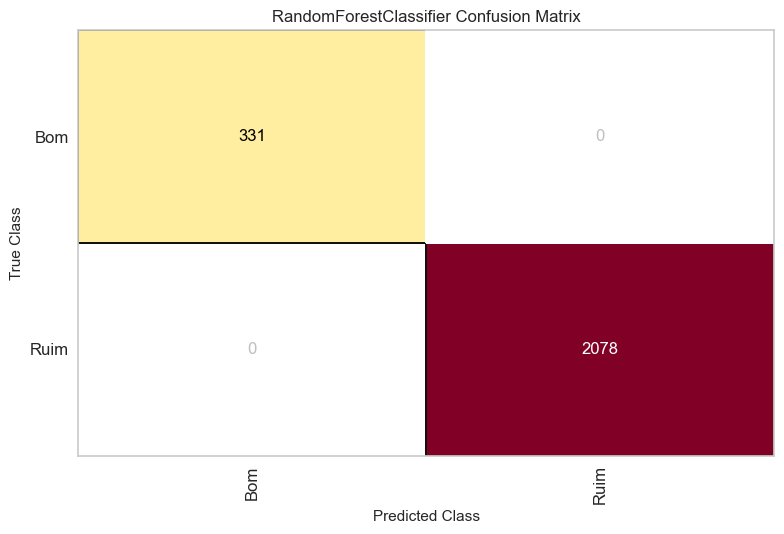

<AxesSubplot:title={'center':'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [122]:
#Visualização da matriz de confusão
v = ConfusionMatrix(RandomForestClassifier())
v.fit(x_treinamento,y_treinamento)
v.score(x_teste, y_teste)
v.poof()

In [123]:
#Taxa de acerto
taxa_acerto

1.0

In [124]:
# Exibir a árvore
estimator = floresta.estimators_
previsores_arvore= ['runtime','genres','imdb_score','imdb_vote','tmdb_score']
classe = ['Filmes/Series']
estimator = floresta.estimators_[5]
export_graphviz(estimator, out_file='random.dot', 
                feature_names = previsores_arvore,
                class_names = 'classe',
                rounded = True, proportion = False, 
                precision = 2, filled = True)


In [125]:
#Converte para png usando comando do sistema
call(['dot', '-Tpng', 'random.dot', '-o', 'random.png', '-Gdpi=600'])

0

In [126]:
# Mostrar a árvore
Image(filename = 'random.png')

## ---------------------------------------------------------------------------------------------------------------------------------